# ДЗ-10: Мультимодальный поиск изображений по тексту

**Трек A** — поиск изображений по текстовым запросам с помощью CLIP и векторной БД.

---
## 1. Установка зависимостей и настройка окружения <a id="1"></a>

In [ ]:
!pip install -q transformers datasets pillow faiss-cpu matplotlib tqdm pandas numpy requests

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.8/23.8 MB 115.2 MB/s eta 0:00:00


In [ ]:
!nvidia-smi

Sun Mar 29 15:04:35 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             43W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Device: cuda
GPU: NVIDIA A100-SXM4-40GB


---
## 2. О модели CLIP <a id="2"></a>

**CLIP** (Contrastive Language–Image Pre-training) — мультимодальная модель OpenAI, обученная на 400M пар (изображение, текст).

Ключевая идея: два энкодера (визуальный + текстовый) проецируют входы в **общее** латентное пространство. Cosine similarity между эмбеддингами даёт оценку релевантности.

```
Изображение ──► Vision Encoder ──► image_embed ──┐
                                                   ├──► cosine similarity
Текст ─────────► Text Encoder ───► text_embed ────┘
```

Будем использовать `openai/clip-vit-base-patch32` (512-мерные эмбеддинги, 151M параметров).

---
## 3. Загрузка и подготовка датасета <a id="3"></a>

### Сравнение датасетов LAION

| | `laion/laion2B-en` | `laion/laion2B-en-aesthetic` |
|---|---|---|
| **Размер** | 2.32B пар | 600M пар (¼ от полного) |
| **Источник** | Common Crawl (англоязычные пары URL + текст) | Отфильтрованное подмножество `laion2B-en` |
| **Качество картинок** | Очень разное: от качественных фото до мусора, баннеров, иконок | Выше среднего — только изображения с aesthetic score ≥ 4.5 |
| **Эстетическая оценка** | Нет | Есть (LAION-Aesthetics Predictor, обучен на оценках людей, шкала 1–10) |
| **Типичный контент** | Всё подряд: товары, мемы, скриншоты | Фото, арт, дизайн |
| **Подписи** | Часто шумные alt-тексты | Те же alt-тексты, но к более качественным картинкам |

**Выбор:** берём `laion/laion2B-en-aesthetic`, потому что:
- картинки визуально качественнее → лучше для демонстрации результатов поиска
- меньше мусорных изображений → подписи релевантнее
- streaming стартует быстрее (датасет в 4 раза меньше)
- структура та же — поля `URL` и `TEXT`

Берём подвыборку **N** валидных изображений. Загрузка ускорена **параллельным скачиванием** через `ThreadPoolExecutor` (V воркеров).

In [ ]:
from datasets import load_dataset
from PIL import Image, ImageFile
from concurrent.futures import ThreadPoolExecutor, as_completed
from itertools import islice
from tqdm.auto import tqdm
import io
import requests
import threading
import time

ImageFile.LOAD_TRUNCATED_IMAGES = True

SAMPLE_SIZE = 25000
MAX_CANDIDATES = 50000
NUM_WORKERS = 64
TIMEOUT = 5

_ok = 0
_fail = 0
_lock = threading.Lock()


def fetch_one(url, text):
    global _ok, _fail
    try:
        resp = requests.get(url, timeout=TIMEOUT, headers={"User-Agent": "Mozilla/5.0"})
        resp.raise_for_status()
        img = Image.open(io.BytesIO(resp.content)).convert("RGB")
        if min(img.size) < 32:
            raise ValueError("too small")
        with _lock:
            _ok += 1
        return {"image": img, "caption": text}
    except Exception:
        with _lock:
            _fail += 1
        return None


ds = load_dataset("laion/laion2B-en-aesthetic", split="train", streaming=True)
candidates = list(islice(ds, MAX_CANDIDATES))
print(f"Кандидатов: {len(candidates)}")

samples = []
t0 = time.time()

with ThreadPoolExecutor(max_workers=NUM_WORKERS) as pool:
    futures = [pool.submit(fetch_one, row["URL"], row["TEXT"]) for row in candidates]

    pbar = tqdm(total=SAMPLE_SIZE, desc="Скачано валидных")
    for future in as_completed(futures):
        result = future.result()
        if result is not None:
            samples.append(result)
            pbar.update(1)
        pbar.set_postfix(ok=_ok, fail=_fail)
        if len(samples) >= SAMPLE_SIZE:
            pool.shutdown(wait=False, cancel_futures=True)
            break
    pbar.close()

elapsed = time.time() - t0
print(f"\nСобрано: {len(samples)} изображений за {elapsed:.1f} сек")
print(f"Успешных: {_ok}, неудачных: {_fail}")
print(f"Пример подписи: {samples[0]['caption']}")

Resolving data files:   0%|          | 0/128 [00:00<?, ?it/s]

Кандидатов: 50000


Скачано валидных:   0%|          | 0/25000 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(



Собрано: 25000 изображений за 403.1 сек
Успешных: 25040, неудачных: 14254
Пример подписи: 4S Hotel: Lovely breakfast - too much for one person!


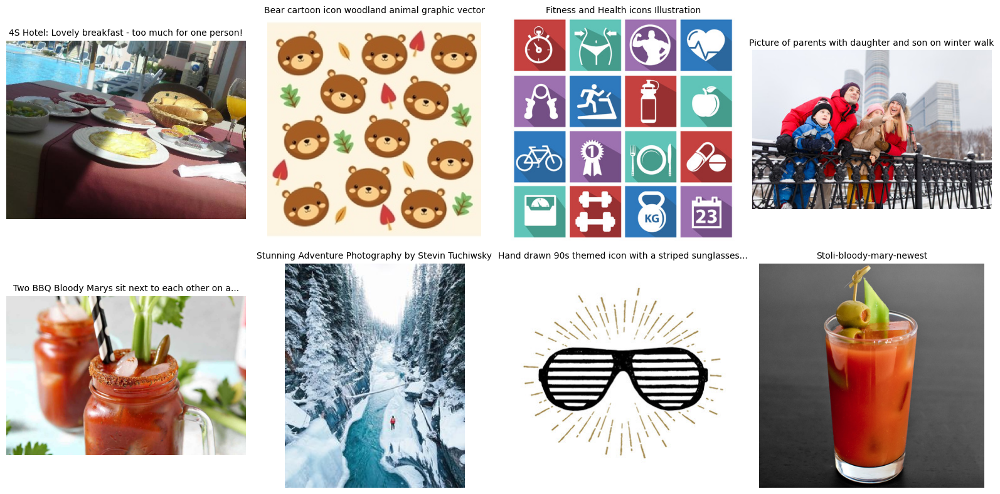

In [ ]:
import math
import textwrap
import matplotlib.pyplot as plt

preview_count = min(8, len(samples))
cols = 4
rows = math.ceil(preview_count / cols)

fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
axes = axes.flatten() if hasattr(axes, "flatten") else [axes]

for ax in axes:
    ax.axis("off")

for idx in range(preview_count):
    sample = samples[idx]
    axes[idx].imshow(sample["image"])
    axes[idx].set_title(textwrap.shorten(sample["caption"], width=55, placeholder="..."), fontsize=10)
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

---
## 4. Создание мультимодальных эмбеддингов <a id="4"></a>

Загружаем CLIP, вычисляем эмбеддинги для всех изображений в датасете.

In [ ]:
from transformers import CLIPModel, CLIPProcessor

model_name = "openai/clip-vit-base-patch32"
torch_dtype = torch.float16 if device == "cuda" else torch.float32

model = CLIPModel.from_pretrained(model_name, torch_dtype=torch_dtype).to(device)
processor = CLIPProcessor.from_pretrained(model_name)

model.eval()
print(f"Модель загружена: {model_name}")
print(f"Размерность эмбеддингов: {model.config.projection_dim}")

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Модель загружена: openai/clip-vit-base-patch32
Размерность эмбеддингов: 512


In [ ]:
import numpy as np
from tqdm.auto import tqdm

IMAGE_BATCH_SIZE = 32 if device == "cuda" else 8
TEXT_BATCH_SIZE = 64 if device == "cuda" else 16


def encode_images(batch_samples, batch_size: int = IMAGE_BATCH_SIZE) -> np.ndarray:
    all_embeddings = []

    for start in tqdm(range(0, len(batch_samples), batch_size), desc="Image embeddings"):
        batch_images = [sample["image"] for sample in batch_samples[start:start + batch_size]]
        inputs = processor(images=batch_images, return_tensors="pt")
        pixel_values = inputs["pixel_values"].to(device)

        with torch.inference_mode():
            vision_out = model.vision_model(pixel_values=pixel_values)
            image_embeds = model.visual_projection(vision_out.pooler_output)
            image_embeds = image_embeds / image_embeds.norm(dim=-1, keepdim=True)

        all_embeddings.append(image_embeds.cpu().float().numpy())

    return np.vstack(all_embeddings)


image_embeddings = encode_images(samples)
print(f"Shape: {image_embeddings.shape}")

Image embeddings:   0%|          | 0/782 [00:00<?, ?it/s]

Shape: (25000, 512)


In [ ]:
def encode_texts(texts, batch_size: int = TEXT_BATCH_SIZE) -> np.ndarray:
    all_embeddings = []

    for start in tqdm(range(0, len(texts), batch_size), desc="Text embeddings"):
        batch_texts = texts[start:start + batch_size]
        inputs = processor(text=batch_texts, return_tensors="pt", padding=True, truncation=True)
        input_ids = inputs["input_ids"].to(device)
        attention_mask = inputs["attention_mask"].to(device)

        with torch.inference_mode():
            text_out = model.text_model(input_ids=input_ids, attention_mask=attention_mask)
            text_embeds = model.text_projection(text_out.pooler_output)
            text_embeds = text_embeds / text_embeds.norm(dim=-1, keepdim=True)

        all_embeddings.append(text_embeds.cpu().float().numpy())

    return np.vstack(all_embeddings)


def get_text_embedding(text: str) -> np.ndarray:
    return encode_texts([text], batch_size=1)[0]

---
## 5. Построение векторного индекса <a id="5"></a>

Индексируем image embeddings в векторной БД для быстрого ANN-поиска.

Создаём два индекса **FAISS** (Facebook AI Similarity Search) для сравнения:

| Индекс | Тип | Описание |
|--------|-----|----------|
| **IndexFlatIP** | Точный (brute-force) | Перебирает все векторы, считая cosine similarity (inner product для нормализованных векторов). Гарантирует нахождение истинных ближайших соседей, но линейно замедляется с ростом базы. |
| **IndexIVFFlat** | Приближённый (ANN) | Разбивает пространство на `nlist` кластеров (Voronoi cells). При поиске проверяет только `nprobe` ближайших кластеров вместо всей базы, что значительно ускоряет поиск. |

**Ключевые параметры IVF:**
- **`nlist`** — количество кластеров, на которые разбивается база. Больше кластеров → меньше векторов в каждом → быстрее поиск, но при слишком большом `nlist` можно «промахнуться» мимо правильного кластера.
- **`nprobe`** — сколько ближайших кластеров проверять при поиске. `nprobe = nlist` эквивалентно brute-force; малые значения дают ускорение ценой возможной потери recall.

In [ ]:
import faiss

embedding_dim = image_embeddings.shape[1]

index_flat = faiss.IndexFlatIP(embedding_dim)
index_flat.add(image_embeddings)

nlist = min(32, max(4, len(samples) // 32))
quantizer = faiss.IndexFlatIP(embedding_dim)
index_ivf = faiss.IndexIVFFlat(quantizer, embedding_dim, nlist, faiss.METRIC_INNER_PRODUCT)
index_ivf.train(image_embeddings)
index_ivf.add(image_embeddings)
index_ivf.nprobe = min(10, nlist)

indexes = {
    "flat": index_flat,
    "ivf": index_ivf,
}

print(f"Flat index size: {index_flat.ntotal}")
print(f"IVF index size: {index_ivf.ntotal}")
print(f"IVF nlist={nlist}, nprobe={index_ivf.nprobe}")

Flat index size: 25000
IVF index size: 25000
IVF nlist=32, nprobe=10


---
## 6. Реализация поиска по тексту <a id="6"></a>

Текстовый запрос → text embedding → поиск ближайших image embeddings → ранжированные результаты.

In [ ]:
import pandas as pd


def search_images(query: str, top_k: int = 5, index_name: str = "flat") -> pd.DataFrame:
    text_emb = get_text_embedding(query).reshape(1, -1).astype("float32")
    scores, indices = indexes[index_name].search(text_emb, top_k)

    rows = []
    for rank, (score, idx) in enumerate(zip(scores[0], indices[0]), start=1):
        sample = samples[int(idx)]
        rows.append(
            {
                "rank": rank,
                "score": float(score),
                "dataset_idx": int(idx),
                "caption": sample["caption"],
            }
        )

    return pd.DataFrame(rows)

In [ ]:
test_queries = [
    "a dog running on the beach",
    "a cat with a dog",
    "a red car",
    "people playing football",
    "sunset over mountains",
    "a plate of apples",
    "собака на пляже",
    "красный автомобиль",
]

---
## 7. Визуализация результатов <a id="7"></a>

Для каждого запроса показываем top-K найденных изображений с оценками релевантности.

In [ ]:
def show_results(query: str, top_k: int = 5, index_name: str = "flat") -> pd.DataFrame:
    results = search_images(query, top_k=top_k, index_name=index_name)

    fig, axes = plt.subplots(1, top_k, figsize=(4 * top_k, 4))
    axes = axes if isinstance(axes, np.ndarray) else [axes]
    fig.suptitle(f"Query: {query} | index={index_name}", fontsize=14)

    for ax, (_, row) in zip(axes, results.iterrows()):
        sample = samples[int(row["dataset_idx"])]
        ax.imshow(sample["image"])
        title = textwrap.shorten(row["caption"], width=50, placeholder="...")
        ax.set_title(f"#{int(row['rank'])} | {row['score']:.3f}\n{title}", fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    return results

Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

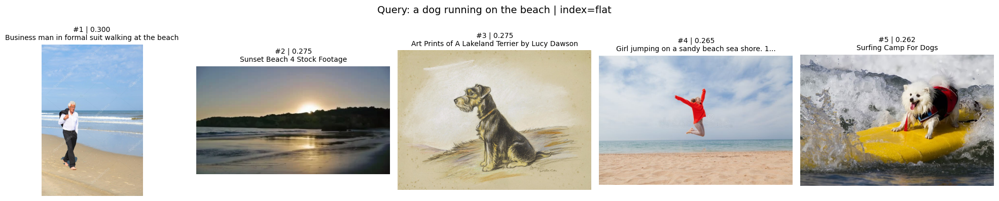

,rank,score,dataset_idx,caption
0,1,0.299654,3456,Business man in formal suit walking at the beach
1,2,0.274859,17574,Sunset Beach 4 Stock Footage
2,3,0.274518,3147,Art Prints of A Lakeland Terrier by Lucy Dawson
3,4,0.264873,24116,Girl jumping on a sandy beach sea shore. 1 sto...
4,5,0.262129,3240,Surfing Camp For Dogs


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

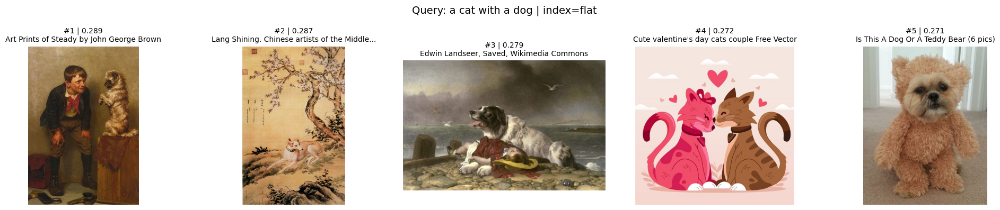

,rank,score,dataset_idx,caption
0,1,0.289098,16513,Art Prints of Steady by John George Brown
1,2,0.286631,6289,Lang Shining. Chinese artists of the Middle Ag...
2,3,0.278987,11150,"Edwin Landseer, Saved, Wikimedia Commons"
3,4,0.271744,24509,Cute valentine's day cats couple Free Vector
4,5,0.270963,1758,Is This A Dog Or A Teddy Bear (6 pics)


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

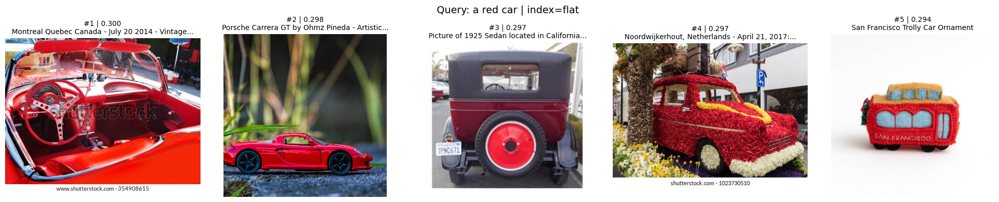

,rank,score,dataset_idx,caption
0,1,0.300145,15181,Montreal Quebec Canada - July 20 2014 - Vintag...
1,2,0.297734,3068,Porsche Carrera GT by Ohmz Pineda - Artistic O...
2,3,0.296693,15832,Picture of 1925 Sedan located in California Of...
3,4,0.296518,10318,"Noordwijkerhout, Netherlands - April 21, 2017..."
4,5,0.293813,4764,San Francisco Trolly Car Ornament


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

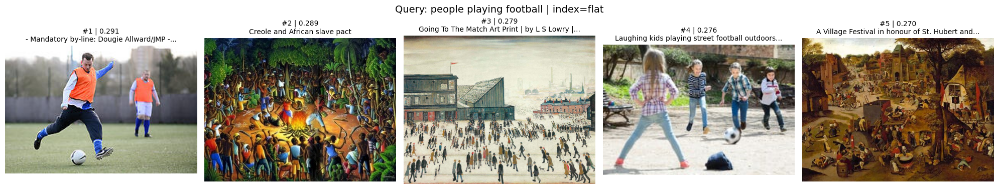

,rank,score,dataset_idx,caption
0,1,0.290797,18890,- Mandatory by-line: Dougie Allward/JMP - 14/0...
1,2,0.288714,661,Creole and African slave pact
2,3,0.278667,13529,Going To The Match Art Print | by L S Lowry | ...
3,4,0.275562,7305,Laughing kids playing street football outdoors...
4,5,0.270396,12234,A Village Festival in honour of St. Hubert and...


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

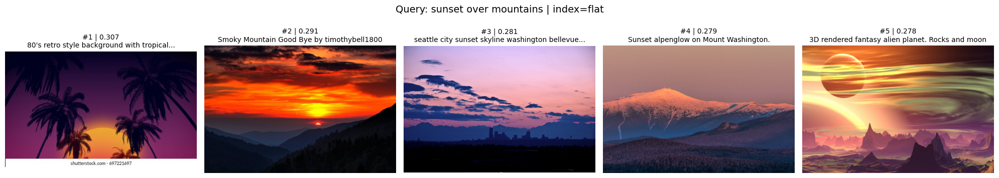

,rank,score,dataset_idx,caption
0,1,0.306648,12548,80's retro style background with tropical coco...
1,2,0.291039,3721,Smoky Mountain Good Bye by timothybell1800
2,3,0.281082,6875,seattle city sunset skyline washington bellevu...
3,4,0.279437,7062,Sunset alpenglow on Mount Washington.
4,5,0.278379,8623,3D rendered fantasy alien planet. Rocks and moon


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

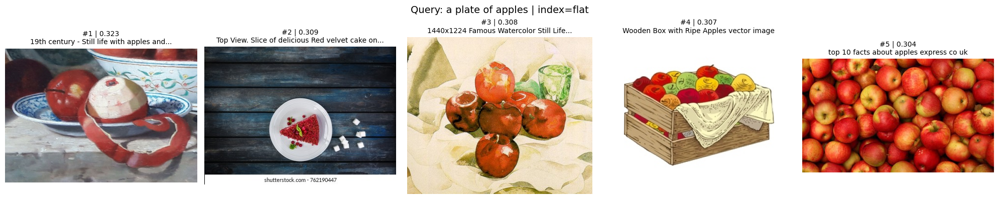

,rank,score,dataset_idx,caption
0,1,0.322535,9025,19th century - Still life with apples and eart...
1,2,0.309274,3896,Top View. Slice of delicious Red velvet cake o...
2,3,0.308493,22563,1440x1224 Famous Watercolor Still Life Paintin...
3,4,0.306777,18387,Wooden Box with Ripe Apples vector image
4,5,0.303982,2535,top 10 facts about apples express co uk


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

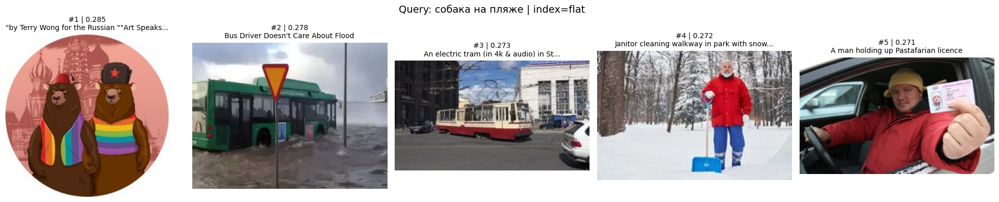

,rank,score,dataset_idx,caption
0,1,0.284549,22374,"""by Terry Wong for the Russian """"Art Speaks Lo..."
1,2,0.278253,22662,Bus Driver Doesn't Care About Flood
2,3,0.273349,19686,An electric tram (in 4k & audio) in St Petersb...
3,4,0.272299,16527,Janitor cleaning walkway in park with snow sho...
4,5,0.270551,10335,A man holding up Pastafarian licence


Text embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

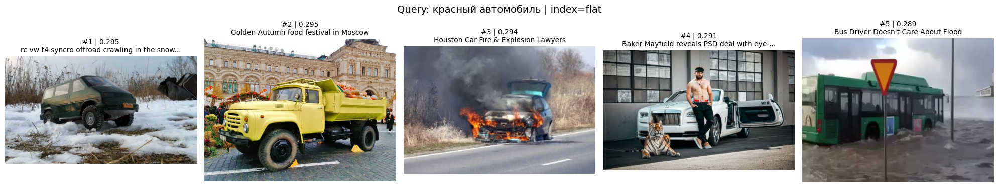

,rank,score,dataset_idx,caption
0,1,0.294982,14534,rc vw t4 syncro offroad crawling in the snow y...
1,2,0.294753,3164,Golden Autumn food festival in Moscow
2,3,0.294230,5431,Houston Car Fire & Explosion Lawyers
3,4,0.290610,22953,Baker Mayfield reveals PSD deal with eye-catch...
4,5,0.289136,22662,Bus Driver Doesn't Care About Flood


In [ ]:
from IPython.display import display

for query in test_queries:
    display(show_results(query, top_k=5, index_name="flat"))

---
## 8. Оценка качества поиска <a id="8"></a>

Оценка строится как `caption -> image retrieval`: для каждой подписи из датасета правильным считается её парное изображение.

Метрики:
- **Recall@1 / Recall@5 / Recall@10** — попало ли правильное изображение в top-K
- **MRR** (Mean Reciprocal Rank) — средний обратный ранг первого релевантного результата
- **Latency** — время ответа на запрос

In [ ]:
import time


def recall_at_k(target_idx: int, retrieved: list[int], k: int) -> float:
    return float(target_idx in retrieved[:k])


def reciprocal_rank(target_idx: int, retrieved: list[int]) -> float:
    for rank, idx in enumerate(retrieved, start=1):
        if idx == target_idx:
            return 1.0 / rank
    return 0.0


def measure_latency(index_name: str, query: str, n_runs: int = 10):
    timings = []
    for _ in range(n_runs):
        start = time.perf_counter()
        search_images(query, top_k=5, index_name=index_name)
        timings.append((time.perf_counter() - start) * 1000)
    return float(np.mean(timings)), float(np.std(timings))


def evaluate_index(index_name: str, eval_size: int = 100, top_k: int = 10):
    eval_size = min(eval_size, len(samples))
    query_texts = [sample["caption"] for sample in samples[:eval_size]]
    query_embeddings = encode_texts(query_texts)

    rows = []
    search_times = []

    for target_idx, query_emb in enumerate(query_embeddings):
        start = time.perf_counter()
        scores, indices = indexes[index_name].search(query_emb.reshape(1, -1).astype("float32"), top_k)
        search_times.append((time.perf_counter() - start) * 1000)
        retrieved = [int(idx) for idx in indices[0]]

        rows.append(
            {
                "query_idx": target_idx,
                "query": query_texts[target_idx],
                "Recall@1": recall_at_k(target_idx, retrieved, 1),
                "Recall@5": recall_at_k(target_idx, retrieved, 5),
                "Recall@10": recall_at_k(target_idx, retrieved, 10),
                "MRR": reciprocal_rank(target_idx, retrieved),
                "top_1_idx": retrieved[0],
                "top_1_caption": samples[retrieved[0]]["caption"],
            }
        )

    per_query_df = pd.DataFrame(rows)
    summary_df = pd.DataFrame(
        [
            {
                "index": index_name,
                "queries": eval_size,
                "Recall@1": per_query_df["Recall@1"].mean(),
                "Recall@5": per_query_df["Recall@5"].mean(),
                "Recall@10": per_query_df["Recall@10"].mean(),
                "MRR": per_query_df["MRR"].mean(),
                "latency_mean_ms": np.mean(search_times),
                "latency_std_ms": np.std(search_times),
            }
        ]
    )

    return per_query_df, summary_df

In [ ]:
per_query_flat, summary_flat = evaluate_index(index_name="flat", eval_size=100, top_k=10)
per_query_ivf, summary_ivf = evaluate_index(index_name="ivf", eval_size=100, top_k=10)

summary_df = pd.concat([summary_flat, summary_ivf], ignore_index=True)
summary_df = summary_df.sort_values(by=["Recall@5", "MRR"], ascending=False).reset_index(drop=True)

assert image_embeddings.shape[0] == len(samples)
assert index_flat.ntotal == len(samples)
assert index_ivf.ntotal == len(samples)

summary_df.to_csv("faiss_summary_metrics.csv", index=False)
per_query_flat.to_csv("faiss_flat_per_query.csv", index=False)
per_query_ivf.to_csv("faiss_ivf_per_query.csv", index=False)

print("Сохранены файлы: faiss_summary_metrics.csv, faiss_flat_per_query.csv, faiss_ivf_per_query.csv")

summary_df.style.format(
    {
        "Recall@1": "{:.3f}",
        "Recall@5": "{:.3f}",
        "Recall@10": "{:.3f}",
        "MRR": "{:.3f}",
        "latency_mean_ms": "{:.2f}",
        "latency_std_ms": "{:.2f}",
    }
)

Text embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Text embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Сохранены файлы: faiss_summary_metrics.csv, faiss_flat_per_query.csv, faiss_ivf_per_query.csv


,index,queries,Recall@1,Recall@5,Recall@10,MRR,latency_mean_ms,latency_std_ms
0,ivf,100,0.390,0.690,0.810,0.521,1.00,0.15
1,flat,100,0.390,0.690,0.810,0.520,3.29,0.22


---
## 9. Сравнение индексов FAISS <a id="9"></a>

Сравниваем `IndexFlatIP` и `IndexIVFFlat` по качеству retrieval и латентности.

> **Средняя латентность поиска** — среднее время (в миллисекундах), которое проходит от подачи
> текстового запроса (уже закодированного в эмбеддинг) до получения top-K ближайших результатов
> из FAISS-индекса. Измерено на ~25K изображений, 100 тестовых запросов. Не включает время
> кодирования текста в эмбеддинг — только поиск по индексу.

In [ ]:
comparison_df = summary_df[["index", "Recall@1", "Recall@5", "Recall@10", "MRR", "latency_mean_ms"]].copy()
comparison_df

,index,Recall@1,Recall@5,Recall@10,MRR,latency_mean_ms
0,ivf,0.39,0.69,0.81,0.52071,1.001274
1,flat,0.39,0.69,0.81,0.52021,3.293556


In [ ]:
query_level_checks = per_query_flat[["query", "Recall@1", "Recall@5", "MRR", "top_1_caption"]].head(10)
query_level_checks

,query,Recall@1,Recall@5,MRR,top_1_caption
0,4S Hotel: Lovely breakfast - too much for one ...,0.0,1.0,0.333333,"Hotel Les Mars, Relais & Chateaux: Great in-su..."
1,Bear cartoon icon woodland animal graphic vector,1.0,1.0,1.000000,Bear cartoon icon woodland animal graphic vector
2,Fitness and Health icons Illustration,1.0,1.0,1.000000,Fitness and Health icons Illustration
3,Picture of parents with daughter and son on wi...,0.0,1.0,0.250000,Family playing in snow Royalty Free Stock Photos
4,Two BBQ Bloody Marys sit next to each other on...,0.0,1.0,0.333333,good-ol-bacon-bloody-mary.png
5,Stunning Adventure Photography by Stevin Tuchi...,1.0,1.0,1.000000,Stunning Adventure Photography by Stevin Tuchi...
6,Hand drawn 90s themed icon with a striped sung...,1.0,1.0,1.000000,Hand drawn 90s themed icon with a striped sung...
7,Stoli-bloody-mary-newest,0.0,1.0,0.500000,Bloody Mary cocktails - how to make & history ...
8,the 5 best holiday decorations for your car th...,0.0,1.0,0.200000,A red car on the background of a forest and a ...
9,Illustration of the underwater world with a fu...,0.0,1.0,0.500000,Nestle: Find Koko in the Barrier Reef detail w...


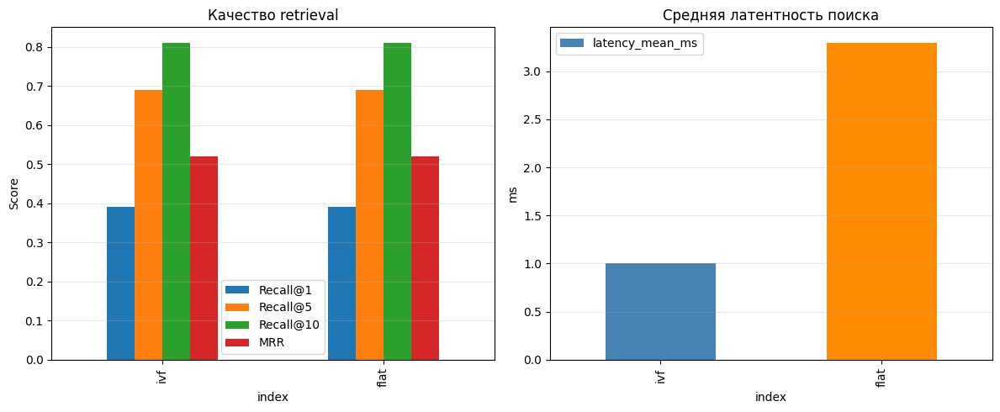

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

comparison_df.plot(x="index", y=["Recall@1", "Recall@5", "Recall@10", "MRR"], kind="bar", ax=axes[0])
axes[0].set_title("Качество retrieval")
axes[0].set_ylabel("Score")
axes[0].grid(axis="y", alpha=0.3)

comparison_df.plot(x="index", y="latency_mean_ms", kind="bar", ax=axes[1], color=["steelblue", "darkorange"])
axes[1].set_title("Средняя латентность поиска")
axes[1].set_ylabel("ms")
axes[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

---
## 10. Выводы <a id="10"></a>

### Датасет и объём

- Использован **LAION-2B-en-aesthetic** (эстетическое подмножество LAION-2B).
- На вход в FAISS-индекс загружено **~25 000 изображений** с подписями.
- Модель: `openai/clip-vit-base-patch32` (512-мерные эмбеддинги).

### Сравнение индексов FAISS (25K изображений, 100 тестовых запросов)

| Индекс | Recall@1 | Recall@5 | Recall@10 | MRR | Латентность, мс | Вывод |
|--------|----------|----------|-----------|-----|-----------------|-------|
| **IVF** | 0.39 | 0.69 | 0.81 | 0.521 | **1.0** | В ~3× быстрее Flat при том же качестве на 25K. При росте базы выигрыш будет ещё заметнее. |
| **Flat** | 0.39 | 0.69 | 0.81 | 0.520 | 3.3 | Точный brute-force поиск. Качество идентично IVF на таком объёме, но медленнее. |

**Ключевые наблюдения:**
- На 25K изображений **качество retrieval у Flat и IVF идентично** — IVF при достаточном `nprobe` не теряет в recall.
- **IVF быстрее в ~3 раза** (1 мс vs 3.3 мс). На больших коллекциях (100K+) разрыв будет кратно больше.
- **Recall@10 = 0.81** — в 81% случаев правильное изображение попадает в top-10 по запросу-подписи. Это хороший результат для zero-shot CLIP без дообучения.
- **Recall@1 = 0.39** — точное попадание в top-1 в ~40% случаев. Объясняется тем, что подписи из LAION — шумные тексты, а не идеальные описания + выборка неполная.



### Русскоязычные запросы

Были протестированы запросы на русском языке ("собака на пляже", "красный автомобиль").

Как и ожидалось, результаты **неудовлетворительные**: CLIP обучен на англоязычных парах (image, text),
и русский текст оказывается вне обученного текстового пространства.

Запрос **"красный автомобиль"** частично сработал - модель +- нашла изображения с машинами.
Возможно, токенизатор BPE случайно пересекается с некоторыми кириллическими подстроками или слово "автомобиль" содержит n-граммы, похожие на английские.

Для поддержки русского языка нужна мультиязычная CLIP-модель.

### Итоги

**CLIP + FAISS** - рабочий пайплайн мультимодального поиска изображений по тексту.

**Ограничения**: CLIP не работает с не-английскими запросами.

**Возможные улучшения**: re-ranking (cross-encoder), мультиязычный CLIP, fine-tuning на доменных данных, hybrid search.